# ERROR ANALYSIS

In [1]:
import plotly

import plotly.plotly as py
import plotly.graph_objs as go

import os
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from PIL import Image
from random import randint
from matplotlib.image import imread
from matplotlib.pyplot import imshow, subplots, axis, figure

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import precision_recall_fscore_support as prfs

%matplotlib inline

## Preparations and Functions

In [2]:
def read_probs(model, batch):
    assert batch == 'train' or batch == 'valid'
    
    path = './features/{}_{}_probs.npy'.format(batch, model)
    return np.load(path)

def preds_by_probs(p):
    """
    differs from Model Training function
    
     INPUT: probabilities of classes and number of classes to keep
    OUTPUT: predictions of top-1 class
    """
    pr = np.zeros(p.shape, dtype='uint8')
    ixs = p.argmax(axis=1)
    
    for i, ix in enumerate(ixs):
        pr[i][ix] = 1
    
    return pr

def flat_preds(p):
    """
    matrix (rows, probs) >> array [class_ids]
    """
    return p.argmax(axis=1).astype(np.int32)

def flat_probs(p):
    """
    matrix (rows, probs) >> array [probs]
    """
    pp = np.zeros(p.shape[0], dtype=p.dtype)
    idxs = p.argmax(axis=1)
    for i, idx in enumerate(idxs):
        pp[i] = p[i][idx]
    return pp

def report_df(y, y_probs, labels):
    """
    gets actual and predicted y in probability form (rows, probs)
    """
    acc, rec, f1, sup = prfs(flat_preds(y), flat_preds(y_probs))
    df = pd.DataFrame({'precision': acc, 'recall': rec, 'f1-score': f1, 'support': sup}, index=labels)
    df['TP'] = (df.support*df.recall).round()
    df['FN'] = df.support-df.TP
    df['FP'] = ((df.support-df.FN)*(1/df.precision-1)).round()
    
    df.loc['TOTAL'] = df.iloc[:,-4:].sum()
    df.loc['TOTAL', ['precision', 'recall', 'f1-score']] = df.iloc[:,:3].mean()
    
    return df.sort_values('support', ascending=False)

def error_df(df, probs, labels):
    """
    prepare df with actual/predicted/prob columns
    """
    
    va = labels[flat_preds(probs)].to_frame()
    va.index = df.index
    df = df.join(va)
    df.columns = ['id', 'actual', 'predicted']
    df['prob'] = flat_probs(probs)
    
    return df.sort_values('prob')

def show_heatmap(cm, title='', **kwargs):
    """
    at first did it by seaborn, but it doesn't look very descriptive
    """
    plt.figure(figsize=(18,18))
    sns.heatmap(cm, square=True, **kwargs)
    plt.ylabel('Actual label', size=15)
    plt.xlabel('Predicted label', size=15)
    title += 'Accuracy Score: {:.2f}%'.format(100*np.trace(cm)/cm.sum())
    plt.title(title, size = 18)
    return plt.show()

def show_heatmaply(cm, labels):
    """
    go interactiveness!
    """
    heatmap = go.Heatmap(z=cm, x=labels, y=labels, colorscale='Hot')
    layout = dict(title='Accuracy Score: {:.2f}%'.format(100*np.trace(cm)/cm.sum()))
    figure = dict(data=[heatmap], layout=layout)
    return py.iplot(figure, filename='heatmap')

def get_img(img_path, size=(299, 299)):
    w, h = size
    img = Image.open(img_path)
    img = img.resize((h,w))
    img = list(img.getdata())
    img = np.array(img)
    return img.reshape((w,h,3))

def get_rand_row(df):
    idx = randint(0, len(df)-1)
    return df.iloc[idx]

def get_data_for_plot(tr, va, breed):
    """
    get breed class and returns data for 4 random pics:
        0: FN from valid set | 1: FP from valid set
        -------------------------------------------
        2: TP from valid set | 3: TP from train set
    INPUT:
        tr - train data frame from error_df function
        va - valid data frame from error_df function
        breed - string name of breed
    """
    r1 = get_rand_row(va[(va.actual!=va.predicted)&(va.actual==breed)])
    r1['title'] = 'valid False Negative'
    r2 = get_rand_row(va[(va.actual!=va.predicted)&(va.predicted==breed)])
    r2['title'] = 'valid False Positive'
    r3 = get_rand_row(va[(va.actual==va.predicted)&(va.actual==breed)])
    r3['title'] = 'valid True Positive'
    r4 = get_rand_row(tr[(tr.actual==tr.predicted)&(tr.actual==breed)])
    r4['title'] = 'train True Positive'
    
    return [r1, r2, r3, r4]

def plot_images(tr, va, breed, size=(299,299)):
    """
    OUTPUT:
        0: FN from valid set | 1: FP from valid set
        -------------------------------------------
        2: TP from valid set | 3: TP from train set
    
    """
    assert 'id' in tr and 'actual' in tr and 'predicted' in tr and 'prob' in tr, 'dataframe should be from error_df function'
    assert 'id' in va and 'actual' in va and 'predicted' in va and 'prob' in va, 'dataframe should be from error_df function'

    f, ax = subplots(2, 2, figsize=(18,18), sharex=True)
    f.subplots_adjust(hspace=0.075, wspace=0.01)
    f.suptitle('Example images of {}'.format(breed.capitalize()).replace('_', ' '), fontsize=20)
    
    r = get_data_for_plot(tr, va, breed)
    
    for r, ax in zip(r, ax.flat):
        
        img_path = './input/train/{}.jpg'.format(r.id)
        img = get_img(img_path, size=size)
        
        ax.imshow(img)
        actual = "Breed: {}".format(r.actual)
        predct = "Predicted {:.2f}%: {}".format(100*r.prob, r.predicted)
        ax.text(20, 264, actual, color='w', backgroundcolor='black', fontsize=13)
        ax.text(20, 279, predct, color='black', backgroundcolor='w', fontsize=13)
        ax.set_title(r.title, size=18)
        
        ax.set_xticks([])
        ax.set_yticks([])
    
    plt.show()
    
def dummy_func(model):
    print('\t\t\t\t\t\tCHOOSED MODEL: {}\n'.format(model.upper()))
    
    tr_probs = read_probs(model, 'train')
    va_probs = read_probs(model, 'valid')
    cm = confusion_matrix(flat_preds(yva), flat_preds(va_probs)) # confusion matrix, obviously
    tr = error_df(df.iloc[tridx], tr_probs, df_cols) # dataframe of all predictions for train set
    va = error_df(df.iloc[vaidx], va_probs, df_cols) # dataframe of all predictions for validation set
    er = va[va.actual != va.predicted] # dataframe of mistaken predictions for validation set
    sc = va[va.actual == va.predicted] # dataframe of correct prediction for validation set
    cr = report_df(yva, va_probs, df_cols) # dataframe of extended classification report
    
    return tr_probs, va_probs, cm, tr, va, er, sc, cr
    
    
SEED = 42 # our seed

df = pd.read_csv('./input/labels.csv')
df_preds = pd.get_dummies(df.breed)
df_cols = df_preds.columns

y = df_preds.values

tridx, vaidx = tts(range(len(df)), test_size=2345, stratify=df.breed, random_state=SEED)

ytr, yva = y[[tridx]], y[[vaidx]]

models = ['all', 'avg', 'inception', 'xception', 'nasnet'] # all probs we saved during model training

## Model Evaluation

Actually we will evaluate all the models trained in Model Training part of this work except for NN bottleneck features >> FC layers. We will use:

        NN >> LogReg, NN all features >> LogReg and averaged Ensemble.

For any given model we will look onto heatmap of confusion matrix between correct validation and predicted breeds, weakest and strongest mistakes, extended classification report a la sklearn with added TruePositives, FalseNegatives and FalsePositives for each breed and in total. At last we will look at most mistaken class by numbers of FN predictions in next template:

                                                        top breed
                                    FN image from valid set | FP image from valid set
                                    -------------------------------------------------
                                    TP image from valid set | TP image from train set

						CHOOSED MODEL: ALL



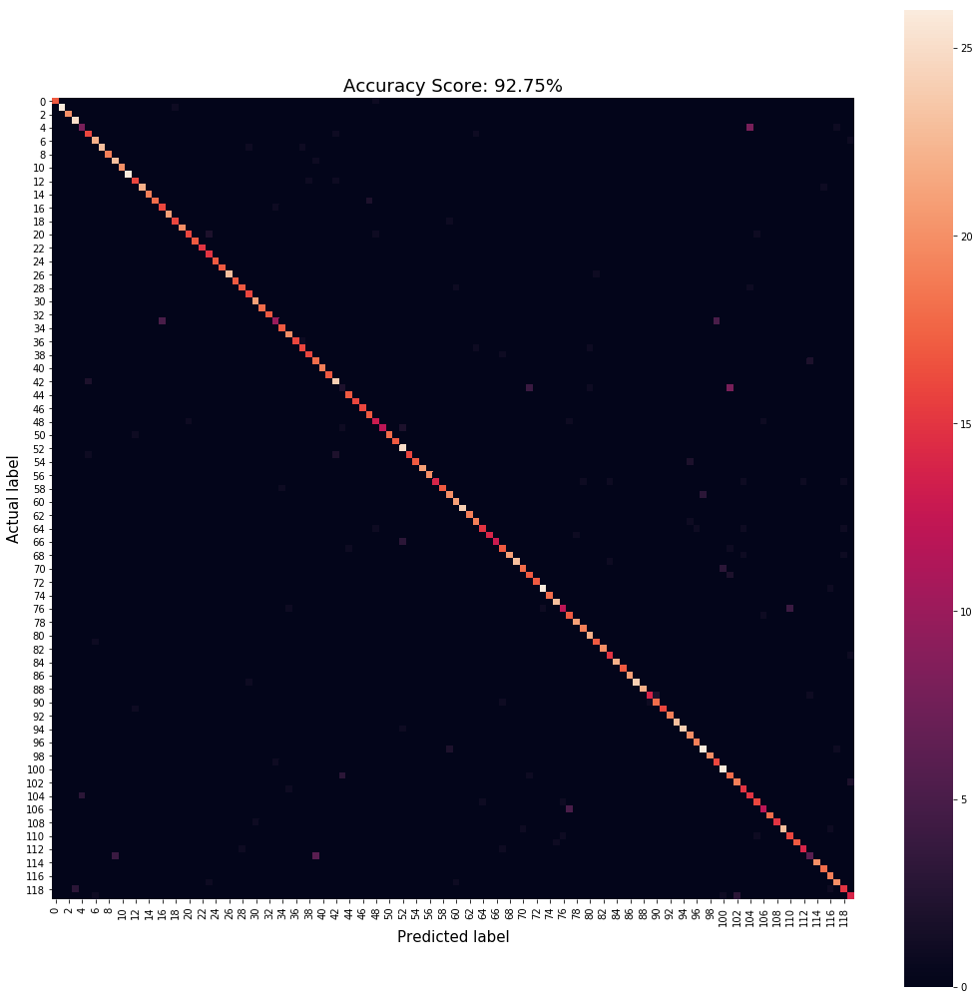

Weakest mistaken image predictions:

                  actual            predicted      prob
7325    golden_retriever           eskimo_dog  0.292300
3950            komondor         newfoundland  0.325951
9663     standard_poodle   kerry_blue_terrier  0.330485
842              basenji            chihuahua  0.336770
6741  standard_schnauzer  miniature_schnauzer  0.341655


Strongest mistaken image predictions:

                    actual            predicted      prob
4958               whippet               briard  0.999109
8970  bouvier_des_flandres               briard  0.999460
1425       giant_schnauzer   standard_schnauzer  0.999682
5701                beagle     english_foxhound  0.999865
3302    standard_schnauzer  miniature_schnauzer  0.999865



Top-10 mistaken breed predictions:

                                f1-score  support      TP     FN     FP
TOTAL                           0.921801   2345.0  2175.0  170.0  170.0
eskimo_dog                      0.190476     15.0     2

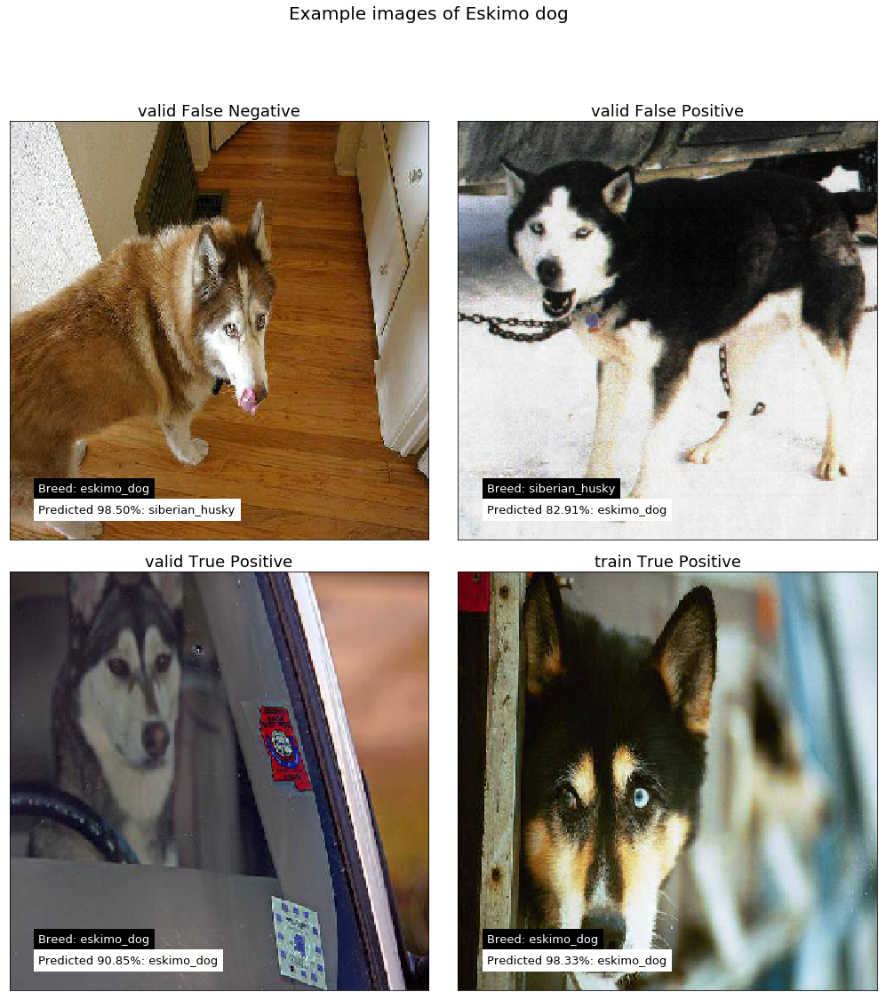

-------------------------------------------------------------------------------------------------------------------------------
						CHOOSED MODEL: AVG



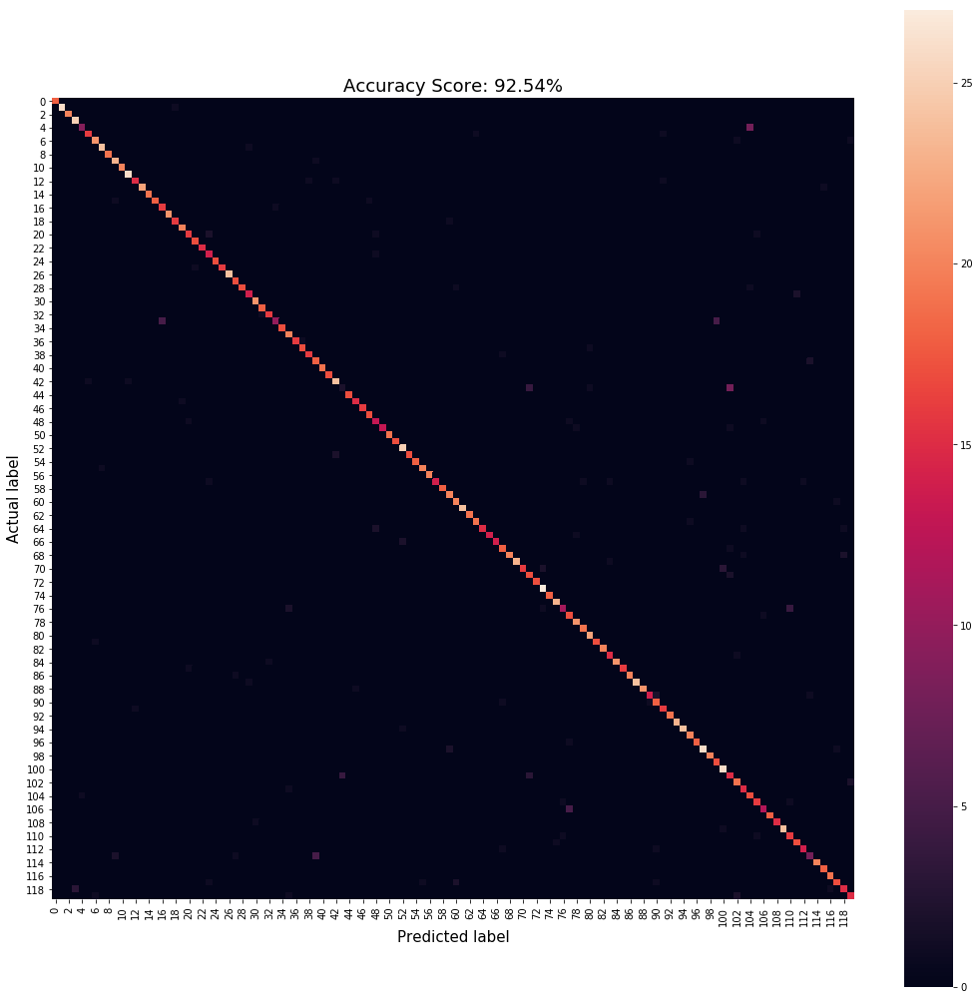

Weakest mistaken image predictions:

                 actual       predicted      prob
842             basenji       chihuahua  0.192805
9663    standard_poodle      toy_poodle  0.209812
3950           komondor    newfoundland  0.242033
7550  yorkshire_terrier  dandie_dinmont  0.244345
6583           papillon  cocker_spaniel  0.251579


Strongest mistaken image predictions:

                    actual            predicted      prob
5687       tibetan_mastiff                 chow  0.989241
8970  bouvier_des_flandres               briard  0.992496
3302    standard_schnauzer  miniature_schnauzer  0.994352
1425       giant_schnauzer   standard_schnauzer  0.995390
5701                beagle     english_foxhound  0.996261



Top-10 mistaken breed predictions:

                                f1-score  support      TP     FN     FP
TOTAL                           0.920255   2345.0  2170.0  175.0  175.0
eskimo_dog                      0.190476     15.0     2.0   13.0    4.0
collie             

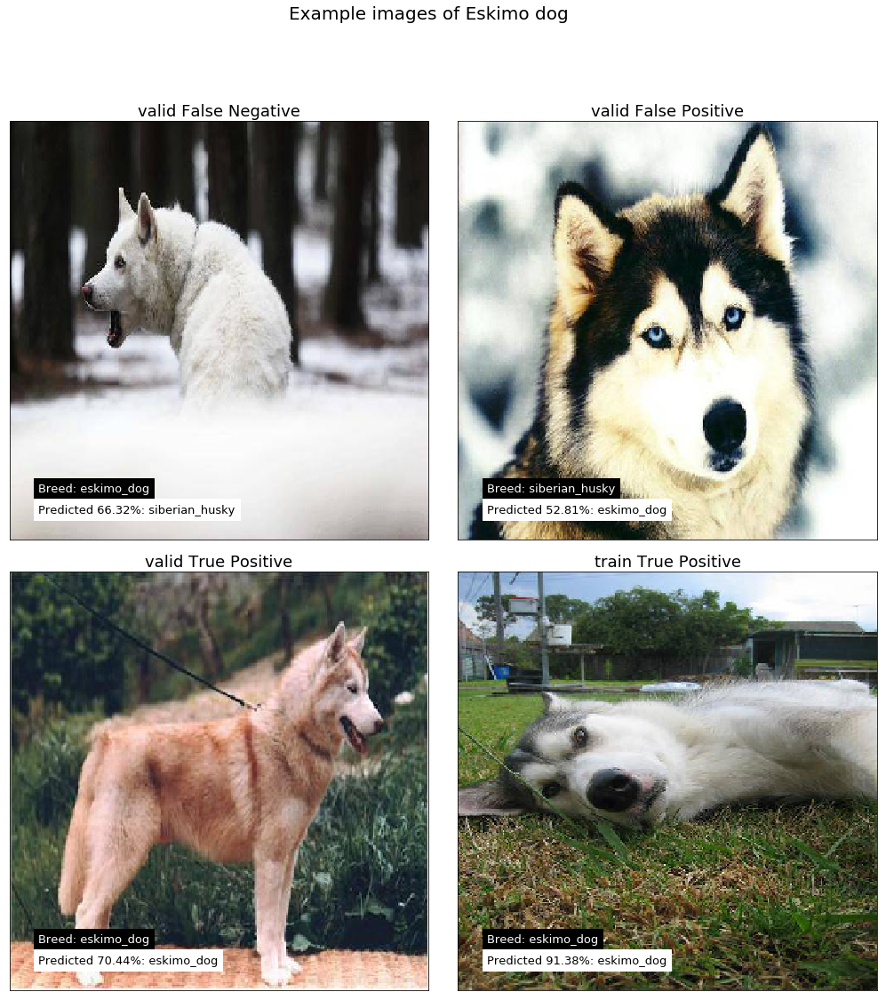

-------------------------------------------------------------------------------------------------------------------------------
						CHOOSED MODEL: INCEPTION



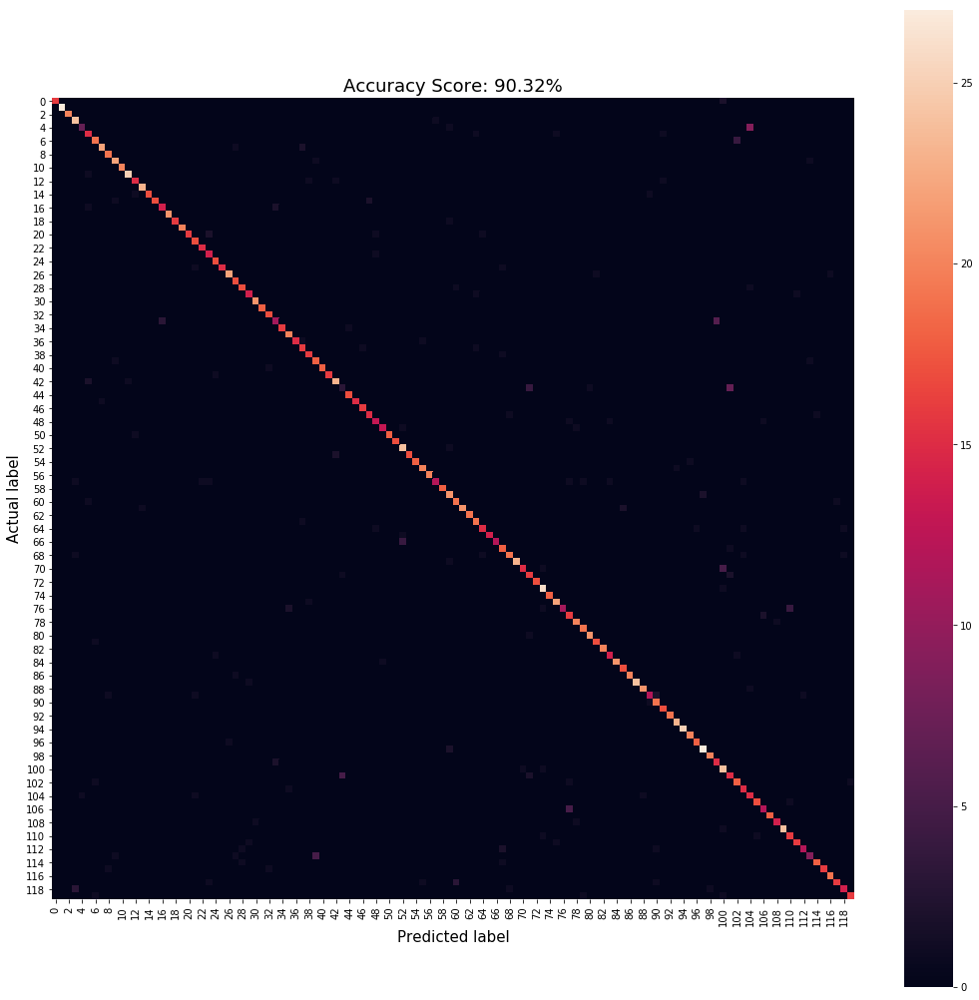

Weakest mistaken image predictions:

               actual                  predicted      prob
8406              pug  staffordshire_bullterrier  0.217806
6540  irish_wolfhound         scottish_deerhound  0.243545
5540     bull_mastiff         labrador_retriever  0.251080
6761   french_bulldog                    basenji  0.263305
3826  giant_schnauzer                 otterhound  0.272541


Strongest mistaken image predictions:

                  actual                    predicted      prob
1425     giant_schnauzer           standard_schnauzer  0.998417
9368            bluetick  german_short-haired_pointer  0.998799
495      irish_wolfhound           scottish_deerhound  0.998985
5701              beagle             english_foxhound  0.999039
3302  standard_schnauzer          miniature_schnauzer  0.999671



Top-10 mistaken breed predictions:

                                f1-score  support      TP     FN     FP
TOTAL                           0.898794   2345.0  2118.0  227.0  227.0
e

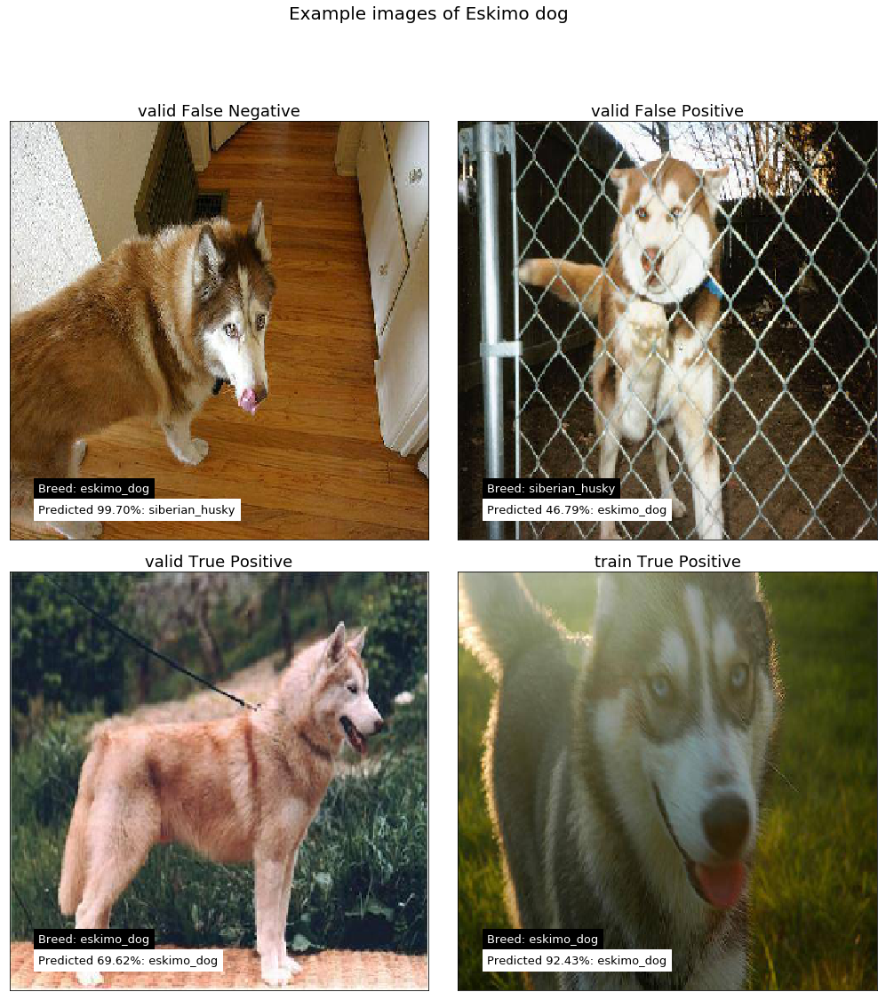

-------------------------------------------------------------------------------------------------------------------------------
						CHOOSED MODEL: XCEPTION



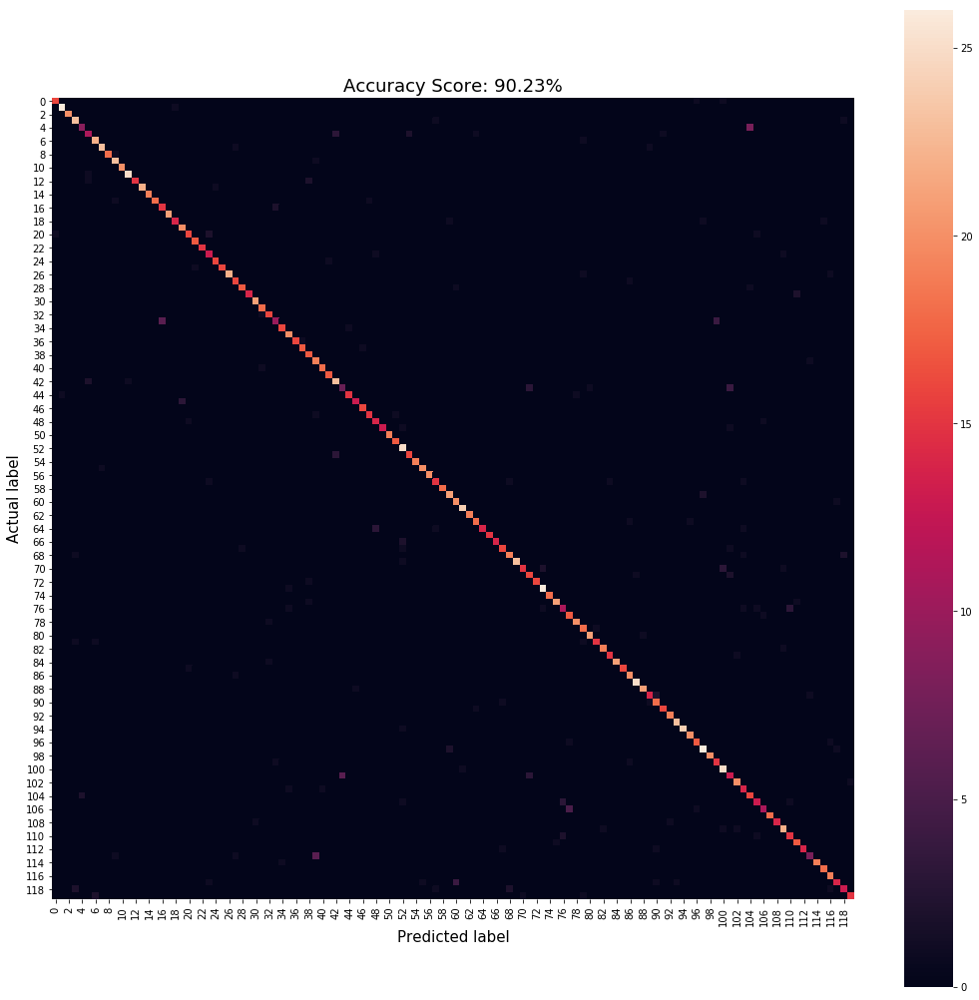

Weakest mistaken image predictions:

                            actual         predicted      prob
934    german_short-haired_pointer  english_foxhound  0.129029
10203                affenpinscher    scotch_terrier  0.148387
4534               norwich_terrier          airedale  0.246795
8339          bouvier_des_flandres   standard_poodle  0.250188
6551                  newfoundland    cocker_spaniel  0.257599


Strongest mistaken image predictions:

                    actual            predicted      prob
495        irish_wolfhound   scottish_deerhound  0.985028
3302    standard_schnauzer  miniature_schnauzer  0.985495
1425       giant_schnauzer   standard_schnauzer  0.988292
5701                beagle     english_foxhound  0.990009
8970  bouvier_des_flandres               briard  0.991812



Top-10 mistaken breed predictions:

                                f1-score  support      TP     FN     FP
TOTAL                           0.898546   2345.0  2116.0  229.0  229.0
collie       

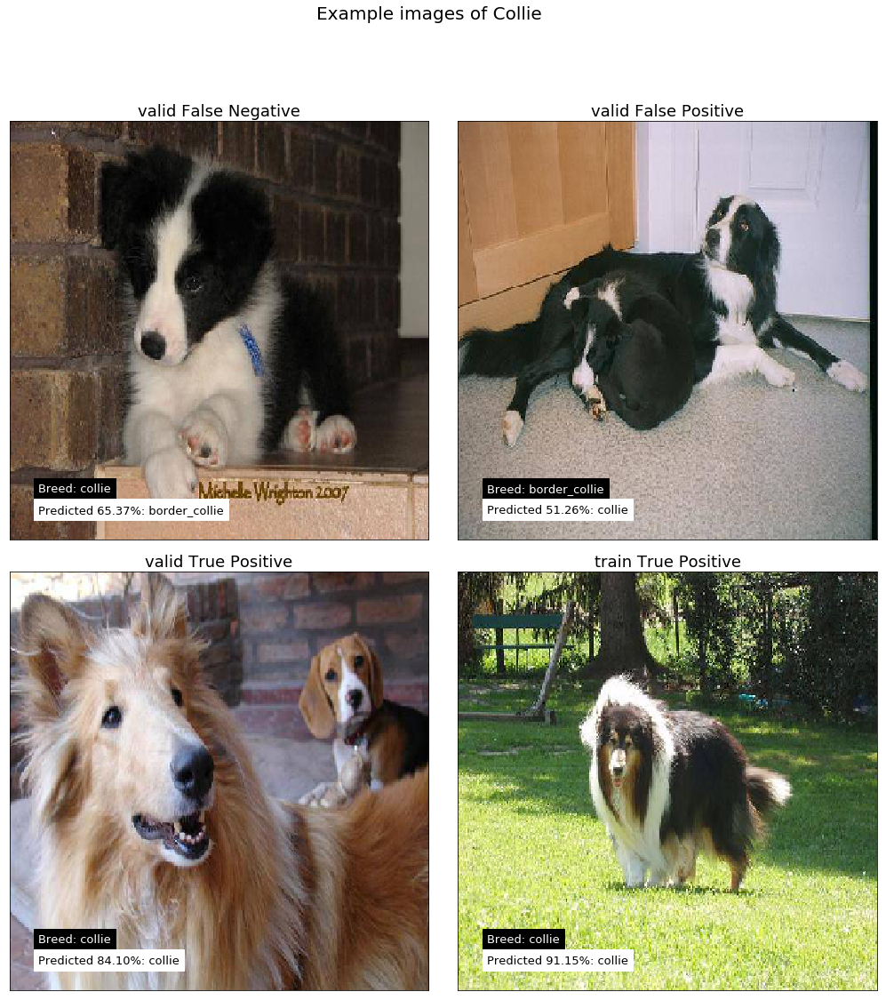

-------------------------------------------------------------------------------------------------------------------------------
						CHOOSED MODEL: NASNET



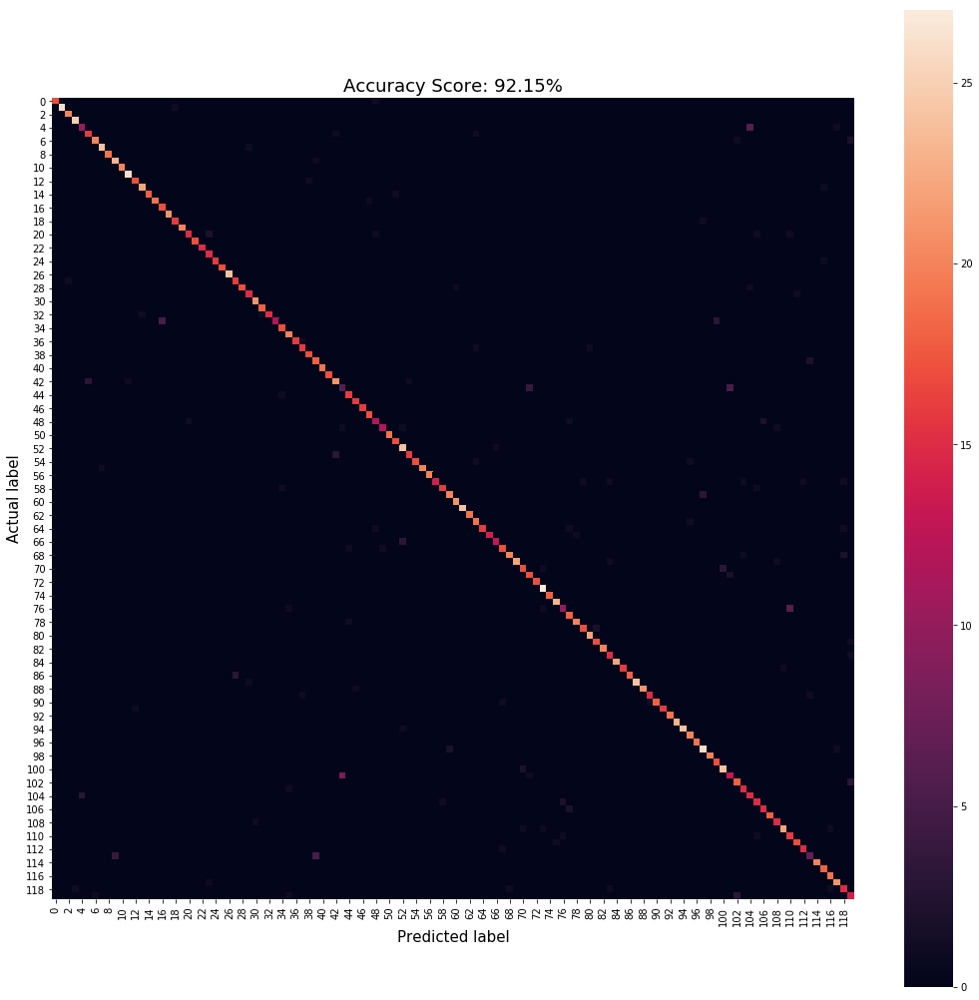

Weakest mistaken image predictions:

                   actual            predicted      prob
9663      standard_poodle  irish_water_spaniel  0.190019
5176             cardigan  african_hunting_dog  0.195515
10094  labrador_retriever     golden_retriever  0.218093
842               basenji            chihuahua  0.275567
5441             pekinese      tibetan_terrier  0.295050


Strongest mistaken image predictions:

                    actual           predicted      prob
4452  bouvier_des_flandres              briard  0.998032
4958               whippet              briard  0.998134
8970  bouvier_des_flandres              briard  0.998723
1425       giant_schnauzer  standard_schnauzer  0.999462
5701                beagle    english_foxhound  0.999735



Top-10 mistaken breed predictions:

                                f1-score  support      TP     FN     FP
TOTAL                           0.917991   2345.0  2161.0  184.0  184.0
eskimo_dog                      0.400000     15.0     6

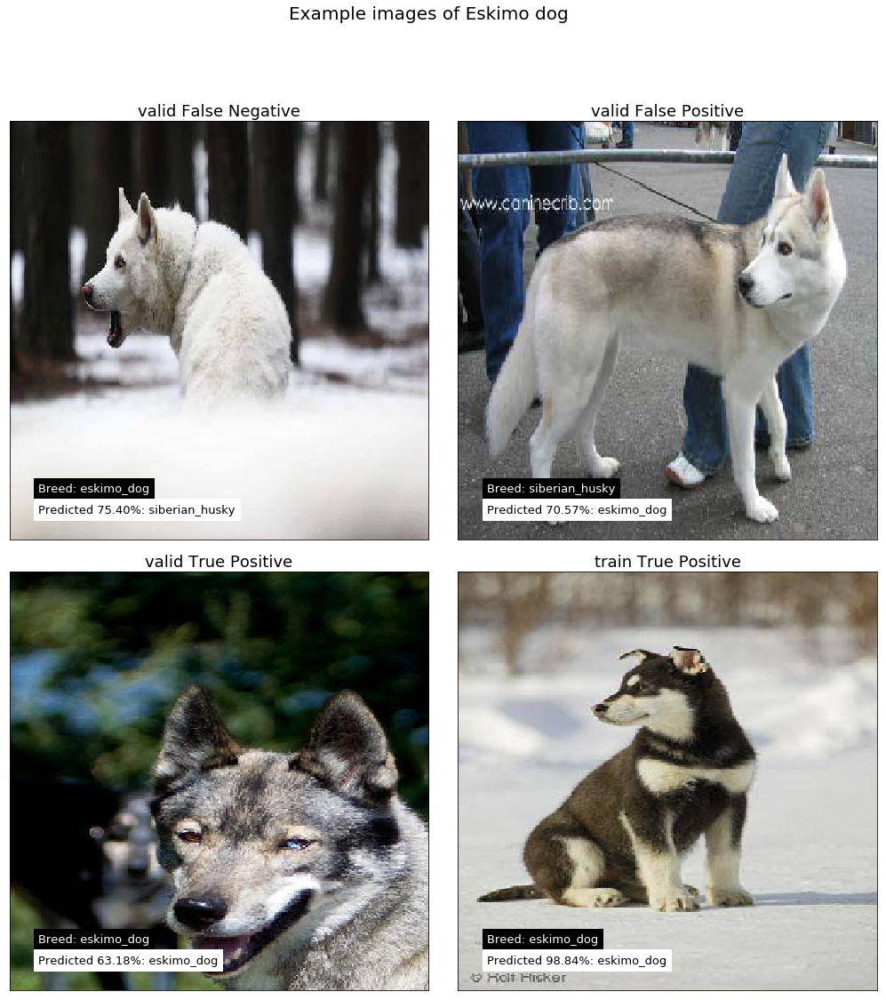

-------------------------------------------------------------------------------------------------------------------------------


In [3]:
for model in models:
    tr_probs, va_probs, cm, tr, va, er, sc, cr = dummy_func(model)
    show_heatmap(cm)
    print('Weakest mistaken image predictions:\n\n{}\n\n'.format(er.iloc[:,-3:].head()))
    print('Strongest mistaken image predictions:\n\n{}\n\n'.format(er.iloc[:,-3:].tail()))
    print('\nTop-10 mistaken breed predictions:\n\n{}\n\n\n'.format(cr.sort_values('FN', ascending=False).iloc[:,-5:].head(11)))
    top_breed = cr[cr.index != 'TOTAL'].sort_values(['FN'], ascending=False).index[0] # took top-1 mistaken breed
    plot_images(tr, va, top_breed)
    print(127*'-')

During this analysis we may notice that most mistaken breed for almost all models is 'eskimo_dog', and even if Xception did it relatively well for this breed, but seemingly by trade-off with increased FN of 'siberian_husky'.

In general we may say that we have some issues with outwardly alike breeds like 'eskimo_dog', 'siberian_husky' and 'malamute'. But these models clearly outperformed me because if truth be spoken I cannot discern these breeds at all. 

## More analysis on Avg Ensemble model

Here we will look onto interactive heatmap from beatiful plotly package and visualize top-5 mistaken breeds of Avg Ensemble model, since we used it for submission purposes.

In [4]:
tr_probs, va_probs, cm, tr, va, er, sc, cr = dummy_func('avg')
show_heatmaply(cm, df_cols)

						CHOOSED MODEL: AVG



It's always good to play with data with all this interactiveness. Here in clear manner we may discover TP, FN and FP values for each pair of breeds.

Now let's visualize top-5 mistaken breeds in beforementioned template.

we take top-5 breeds from this table:

                                  recall  f1-score  support    TP    FN    FP
eskimo_dog                      0.133333  0.190476     15.0   2.0  13.0   4.0
collie                          0.500000  0.645161     20.0  10.0  10.0   1.0
walker_hound                    0.500000  0.592593     16.0   8.0   8.0   3.0
american_staffordshire_terrier  0.529412  0.666667     17.0   9.0   8.0   1.0
siberian_husky                  0.681818  0.612245     22.0  15.0   7.0  12.0
miniature_poodle                0.611111  0.709677     18.0  11.0   7.0   2.0
irish_terrier                   0.736842  0.848485     19.0  14.0   5.0   0.0
whippet                         0.772727  0.829268     22.0  17.0   5.0   2.0
standard_schnauzer              0.705882  0.774194     17.0  12.0   5.0   2.0
lhasa                           0.761905  0.864865     21.0  16.0   5.0   0.0


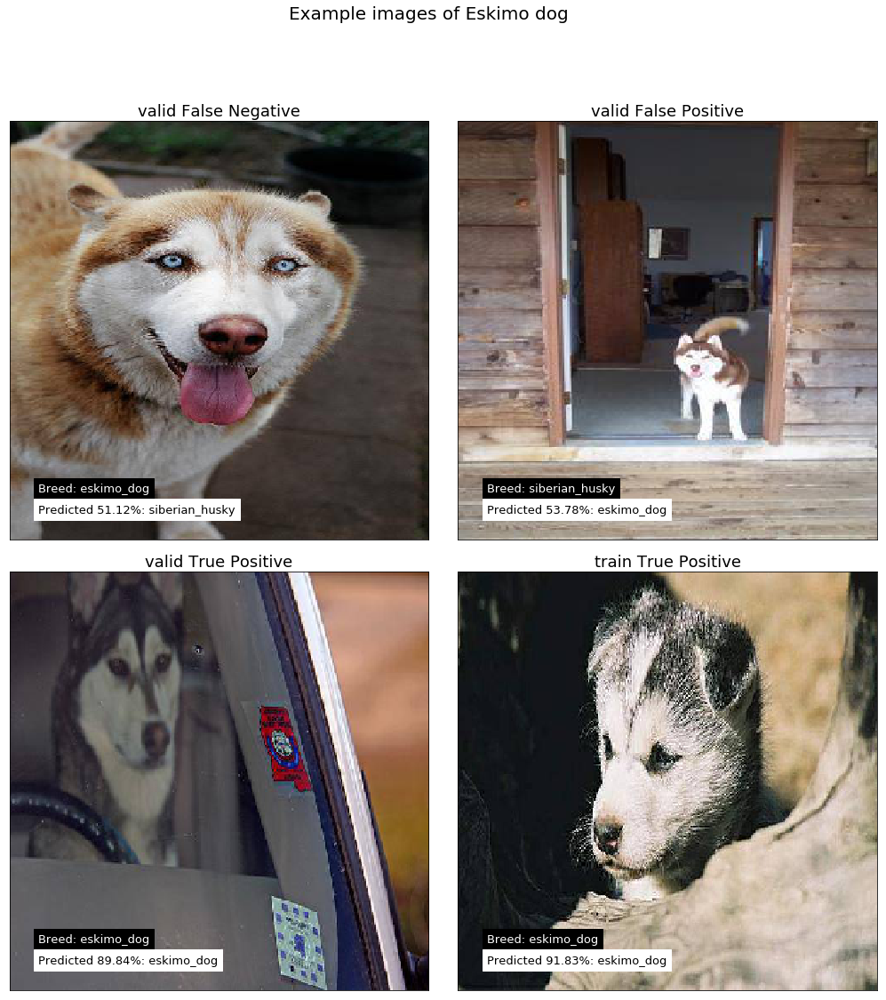

-------------------------------------------------------------------------------------------------------------------------------


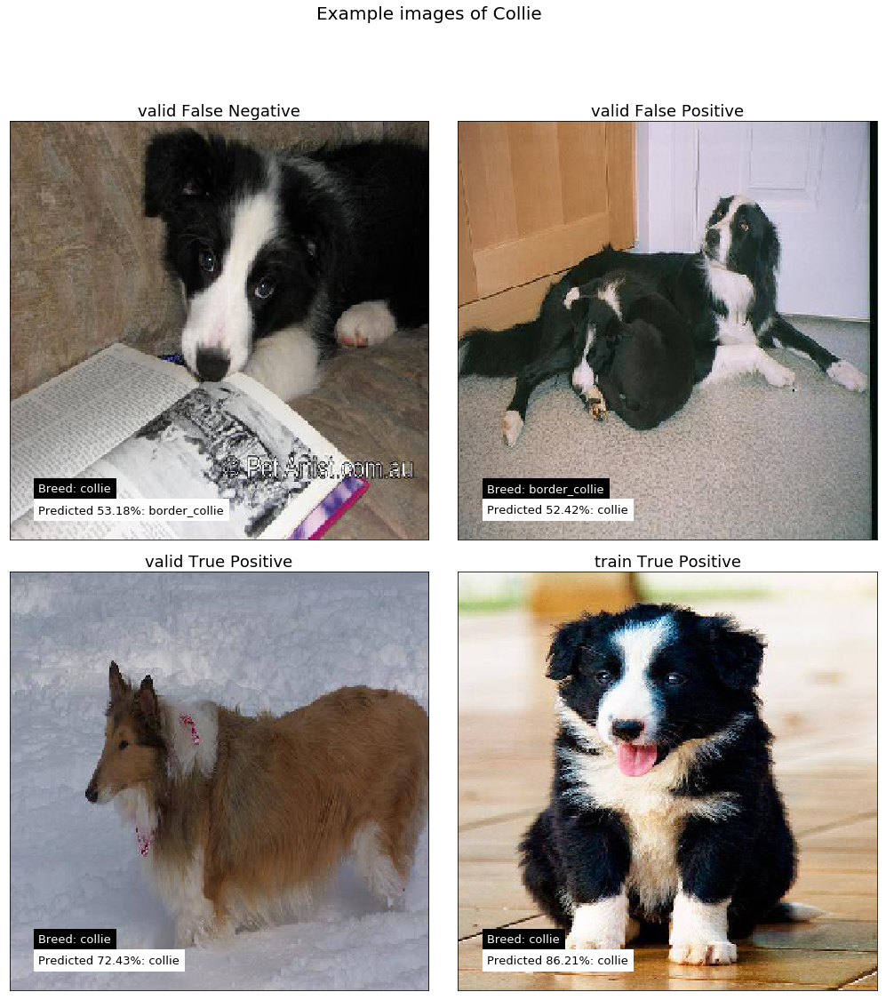

-------------------------------------------------------------------------------------------------------------------------------


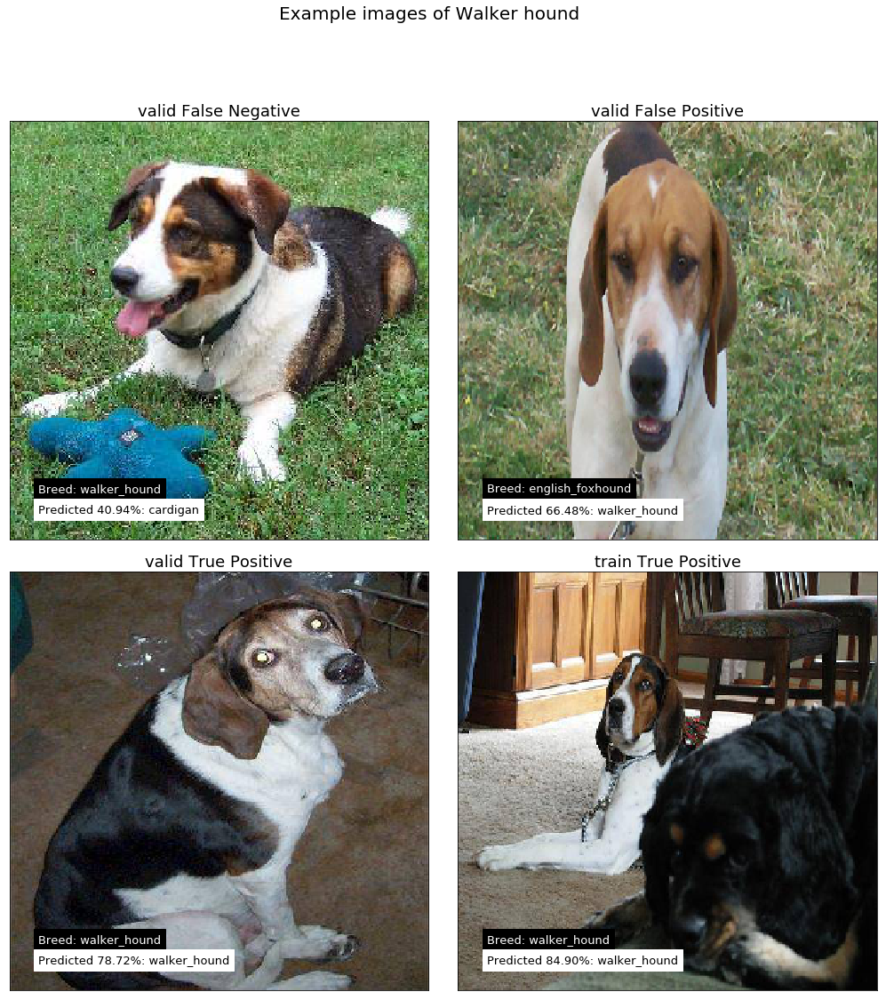

-------------------------------------------------------------------------------------------------------------------------------


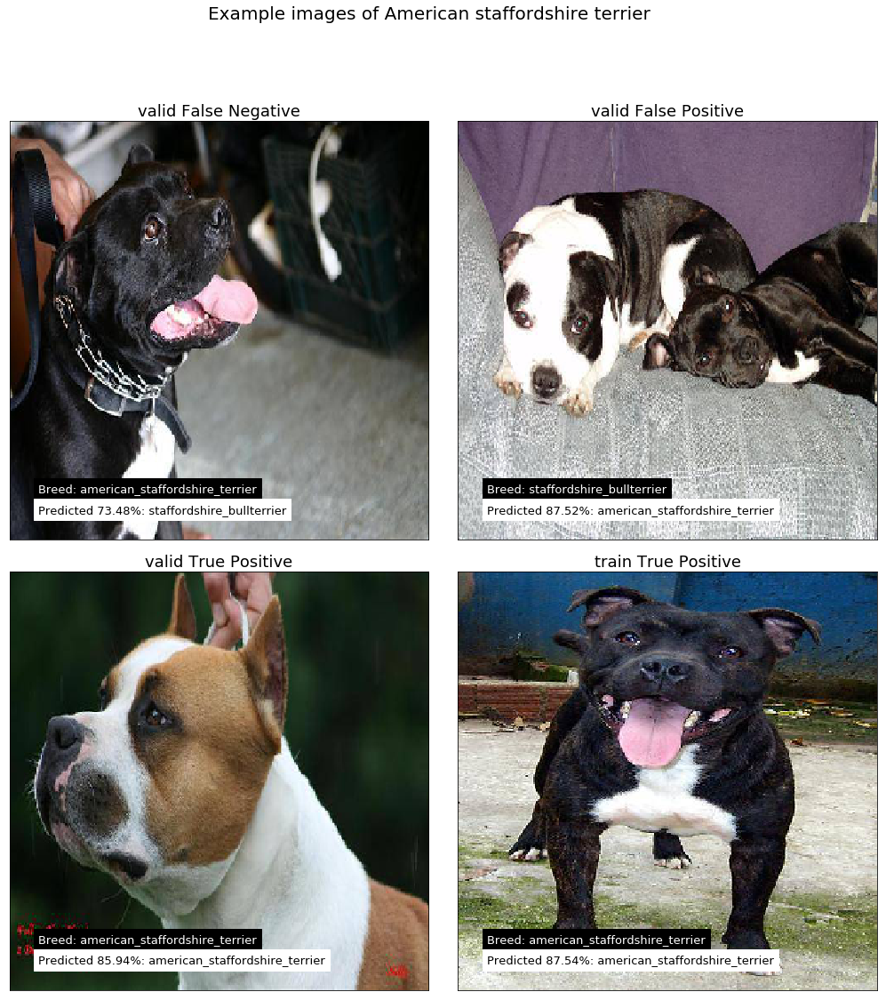

-------------------------------------------------------------------------------------------------------------------------------


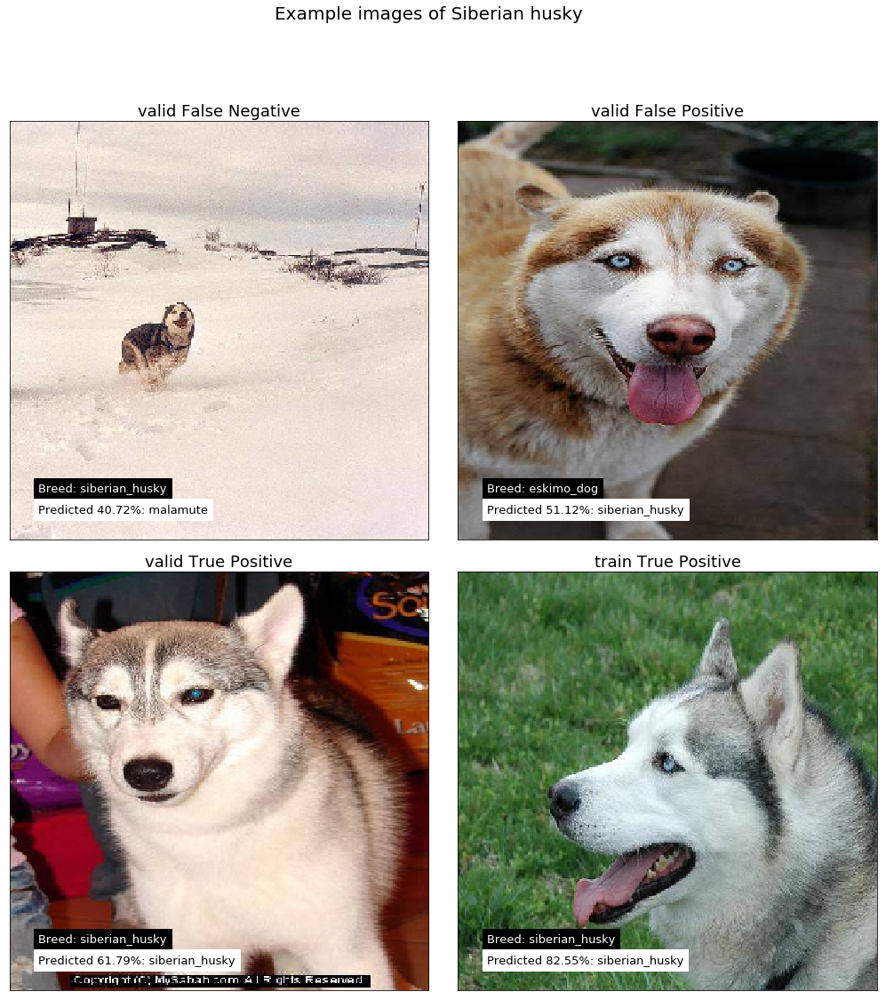

-------------------------------------------------------------------------------------------------------------------------------


In [5]:
cr10fn = cr[cr.index != 'TOTAL'].iloc[:,-6:].sort_values(['FN'], ascending=False).head(10)
# last 6, because all column hard to read
top5 = cr10fn.index[:5]
print('we take top-5 breeds from this table:\n\n{}'.format(cr10fn))

for breed in top5:
    plot_images(tr, va, breed)
    print(127*'-')

Actually by looking at these pictures I'm considering if all the train data labeled correctly, e.g. 'collie' and 'border_collie', 'eskimo_dog' and 'siberian_husky', regional types of 'terriers' - they seems to be mistaken in some train cases, at least for me.

## Next Steps

During the Data Exploration and Model Training sections as well as current Error Analysis I accumulated some thoughts and ideas about next steps for model performance improvement and even have implemented some of them:
#### 1. Data preparation:

1. Since the train data breed distribution skewed we may want to prepare more images for classes by simple horizontal mirroring.
2. I didn't make it in time, but had the idea to check connection between image sizes and erroneous of prediction. Maybe we will find that different aspects of images or big/small ones perform worse due to image resizing issues. In that case we may want to skip them altogether or resize in different way, like padding smaller ones.
3. For top mistaken classes I think we should do some manual work of overchecking labels and clearing images from distracting objects, maybe even add some data from external sources

#### 2. Data augmentation:

Mermory issue was my most troublesome during Model Training - 8Gb are not enough for reading all the images in desired shape and shape of images affects the model performance very much, or I did something wrong.

I want to keep my shape big because my first approaches with smaller ones performed worse on all the models even in comparison with ResNet50 predictions of these breeds from 1000 classes of ImageNet competition.

1. Actually I tried to use built-in keras ImageDataGenerator class, but parameters was almost random. We may want to fine-tune and calibrate existing ones, try all the rest and check the performance changes.
2. Try to use flow_from_directory method. Maybe this will solve my memory issue and open the gate for better performance while iterating between approaches. 

#### 3. Model architecture:

I don't think that we will be OK without transfer learning since the dataset isn't very big, but for the purpose of performance comparison we may try to build NN from scratch

1. Add FC layers in place of LogReg cap - done actually
    
        I tried model perfomance for all the transfer learning models & combo
    
    
2. Ty different architectures and fine-tune some hyperparameters

        Mine FC layers on top of bottleneck features tends to overfit, so we have to coduct experiments about
        stop-criteria before overfitting or/and adding some regularizations


3. Training model from input to output, without freezing first layers

        Mine GPU performed considerably quick during FC layers training, so we may want to look into gradually 
        freezing layers from input to output instead of using bottleneck features only

4. Add more state-of-art models into ensemble
    
        Actually at first there were 4 models: ResNet50, VGG16, Xception, InceptionV3. But first ones did not so well by
        LogReg cap, so for performance issues I decided to stay on last two, but later added NASNetLarge into the pile.
    
    
5. Try different ensembles - subsets of models

        If we will use not all the models we may find some better version of ensemble in terms of validation/final score

6. Try to clean probabilities and keep only top-N, adding all the rest to top-1 and nullifying them - done actually
        
        With some N parameter tuning validation logloss increased, but while trying to submit some of the cleaned probs
        to kaggle it performed much worse than expected.
        
        Maybe this option may be improved a bit further and take into consideration differencies between top-N values
        and averaging nullified sum between them in case of 30-70% probabilities.